RFE NEE

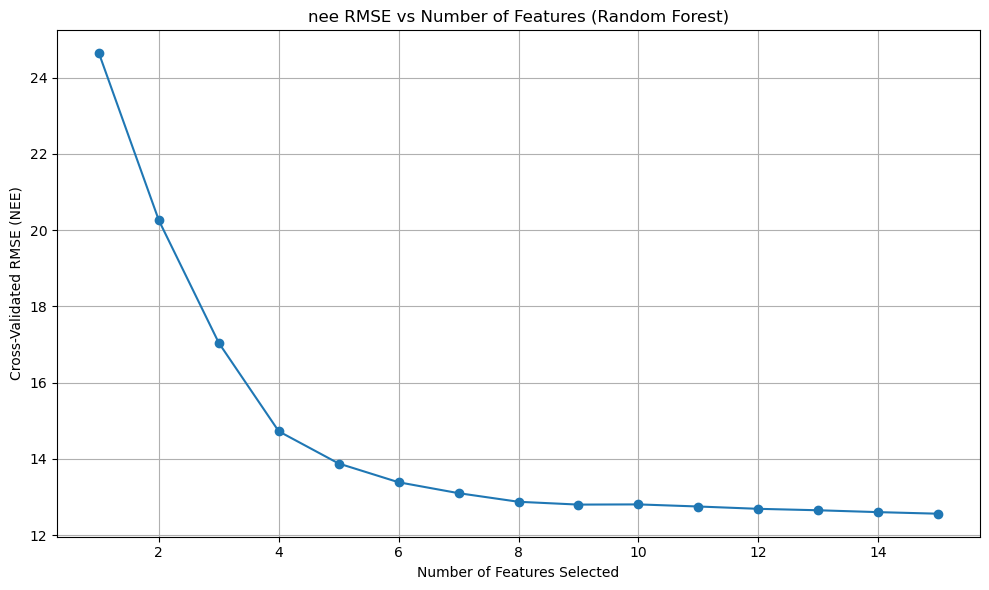

Optimal number of features: 1
Selected features: ['tmean_C']


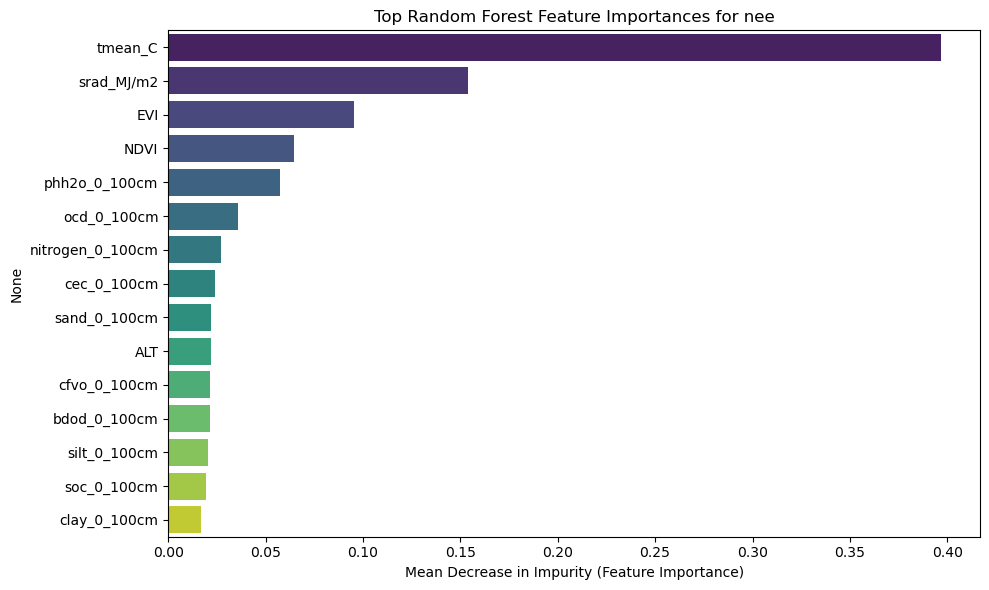

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFECV
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, make_scorer
import warnings
import os
warnings.filterwarnings('ignore')


# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil.csv")  

#fill nan with 0 for alt years 1997-2021
# 1. Print the count of NaN values before the operation
nans_before = df['ALT'].isna().sum()

# 2. Define the condition for the years 1997-2021
time_interval_mask = (df['year'] >= 1997) & (df['year'] <= 2021)

# 3. Fill NaN values in the 'ALT' column with 0 ONLY for the specified years
# We use .loc[mask, column] to modify the slice of the DataFrame
df.loc[time_interval_mask, 'ALT'] = df.loc[time_interval_mask, 'ALT'].fillna(2000)


# # 2. Create tmean_C and date
# df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
# df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# # 3. Define predictors and target
# predictor_vars = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
#                   'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
#                   'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']
# target_var = 'nee'

# out_path = os.path.join("/explore/nobackup/people/spotter5/anna_v/v2/loocv", target_var)
# os.makedirs(out_path, exist_ok = True)

# # 4. Drop rows with missing predictor or target values
# df_model = df[predictor_vars + [target_var]].dropna()

# # 5. Prepare input data
# X = df_model[predictor_vars]
# y = df_model[target_var]

# # 6. Set up scoring, model, and cross-validation
# rmse_scorer = make_scorer(mean_squared_error, squared=False)
# rf = RandomForestRegressor(n_estimators=500, random_state=42, n_jobs=-1)
# cv = KFold(n_splits=5, shuffle=True, random_state=42)

# # 7. Run RFECV
# rfecv = RFECV(estimator=rf, step=1, cv=cv, scoring=rmse_scorer, n_jobs=-1)
# rfecv.fit(X, y)

# # 8. Plot RMSE vs number of features
# plt.figure(figsize=(10, 6))
# plt.plot(
#     range(1, len(rfecv.cv_results_['mean_test_score']) + 1),
#     rfecv.cv_results_['mean_test_score'],
#     marker='o'
# )
# plt.xlabel("Number of Features Selected")
# plt.ylabel("Cross-Validated RMSE (NEE)")
# plt.title(f"{target_var} RMSE vs Number of Features (Random Forest)")
# plt.grid(True)
# plt.tight_layout()
# plt.savefig(os.path.join(out_path, 'rfe_soil_alt.png'))
# plt.show()

# # 9. Print selected features
# selected_features = list(X.columns[rfecv.support_])
# print("Optimal number of features:", rfecv.n_features_)
# print("Selected features:", selected_features)

# # 10. Train full model and compute feature importances
# full_rf = RandomForestRegressor(n_estimators=500, random_state=42, n_jobs=-1)
# full_rf.fit(X, y)
# full_importances = pd.Series(full_rf.feature_importances_, index=X.columns)
# top_10_features = full_importances.sort_values(ascending=False).head(20)

# # 11. Plot feature importances
# plt.figure(figsize=(10, 6))
# sns.barplot(x=top_10_features.values, y=top_10_features.index, palette="viridis")
# plt.xlabel("Mean Decrease in Impurity (Feature Importance)")
# plt.title(f"Top Random Forest Feature Importances for {target_var}")
# plt.savefig(os.path.join(out_path, 'rf_importance_soil_alt.png'))
# plt.tight_layout()
# plt.show()

RFE GPP

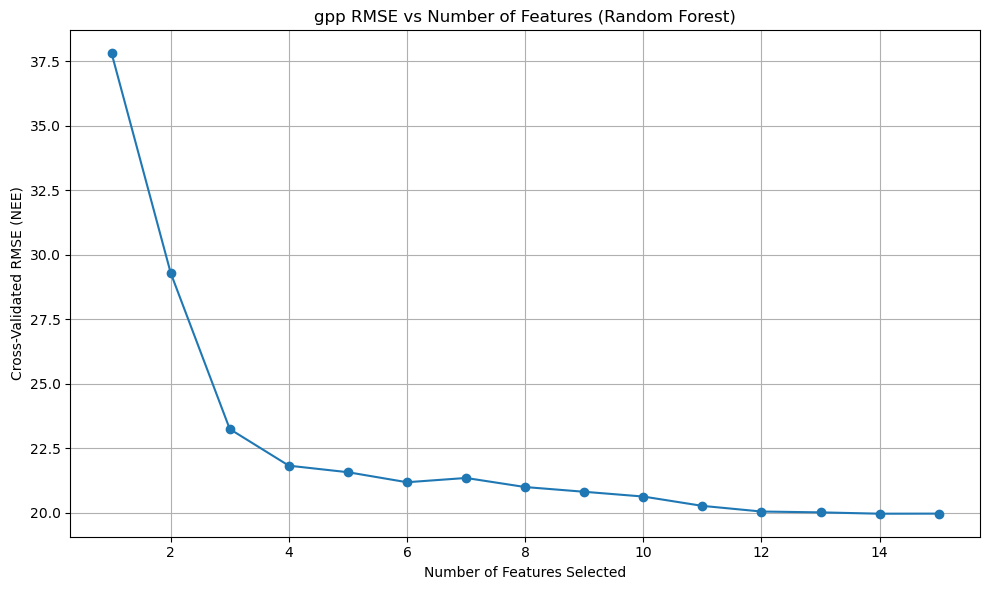

Optimal number of features: 1
Selected features: ['tmean_C']


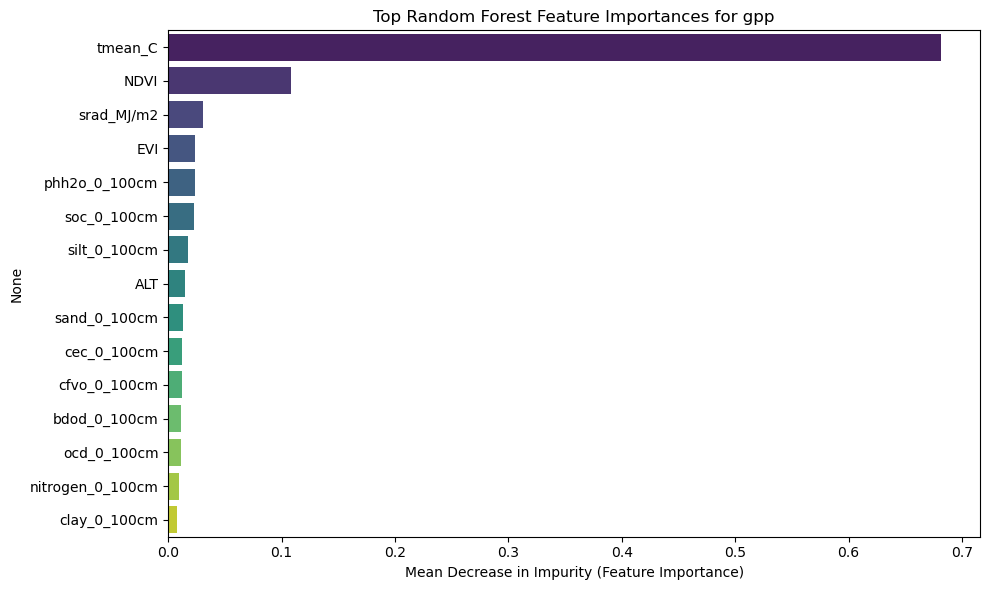

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFECV
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, make_scorer
import warnings
import os
warnings.filterwarnings('ignore')

# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil.csv")  

#fill nan with 0 for alt years 1997-2021
# 1. Print the count of NaN values before the operation
nans_before = df['ALT'].isna().sum()

# 2. Define the condition for the years 1997-2021
time_interval_mask = (df['year'] >= 1997) & (df['year'] <= 2021)

# 3. Fill NaN values in the 'ALT' column with 0 ONLY for the specified years
# We use .loc[mask, column] to modify the slice of the DataFrame
df.loc[time_interval_mask, 'ALT'] = df.loc[time_interval_mask, 'ALT'].fillna(2000)


# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
predictor_vars = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']
target_var = 'gpp'

out_path = os.path.join("/explore/nobackup/people/spotter5/anna_v/v2/loocv", target_var)
os.makedirs(out_path, exist_ok = True)

# 4. Drop rows with missing predictor or target values
df_model = df[predictor_vars + [target_var]].dropna()

# 5. Prepare input data
X = df_model[predictor_vars]
y = df_model[target_var]

# 6. Set up scoring, model, and cross-validation
rmse_scorer = make_scorer(mean_squared_error, squared=False)
rf = RandomForestRegressor(n_estimators=500, random_state=42, n_jobs=-1)
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# 7. Run RFECV
rfecv = RFECV(estimator=rf, step=1, cv=cv, scoring=rmse_scorer, n_jobs=-1)
rfecv.fit(X, y)

# 8. Plot RMSE vs number of features
plt.figure(figsize=(10, 6))
plt.plot(
    range(1, len(rfecv.cv_results_['mean_test_score']) + 1),
    rfecv.cv_results_['mean_test_score'],
    marker='o'
)
plt.xlabel("Number of Features Selected")
plt.ylabel("Cross-Validated RMSE (NEE)")
plt.title(f"{target_var} RMSE vs Number of Features (Random Forest)")
plt.grid(True)
plt.tight_layout()
plt.savefig(os.path.join(out_path, 'rfe_soil_alt.png'))
plt.show()

# 9. Print selected features
selected_features = list(X.columns[rfecv.support_])
print("Optimal number of features:", rfecv.n_features_)
print("Selected features:", selected_features)

# 10. Train full model and compute feature importances
full_rf = RandomForestRegressor(n_estimators=500, random_state=42, n_jobs=-1)
full_rf.fit(X, y)
full_importances = pd.Series(full_rf.feature_importances_, index=X.columns)
top_10_features = full_importances.sort_values(ascending=False).head(20)

# 11. Plot feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x=top_10_features.values, y=top_10_features.index, palette="viridis")
plt.xlabel("Mean Decrease in Impurity (Feature Importance)")
plt.title(f"Top Random Forest Feature Importances for {target_var}")
plt.savefig(os.path.join(out_path, 'rf_importance_soil_alt.png'))
plt.tight_layout()
plt.show()

RFE RECO

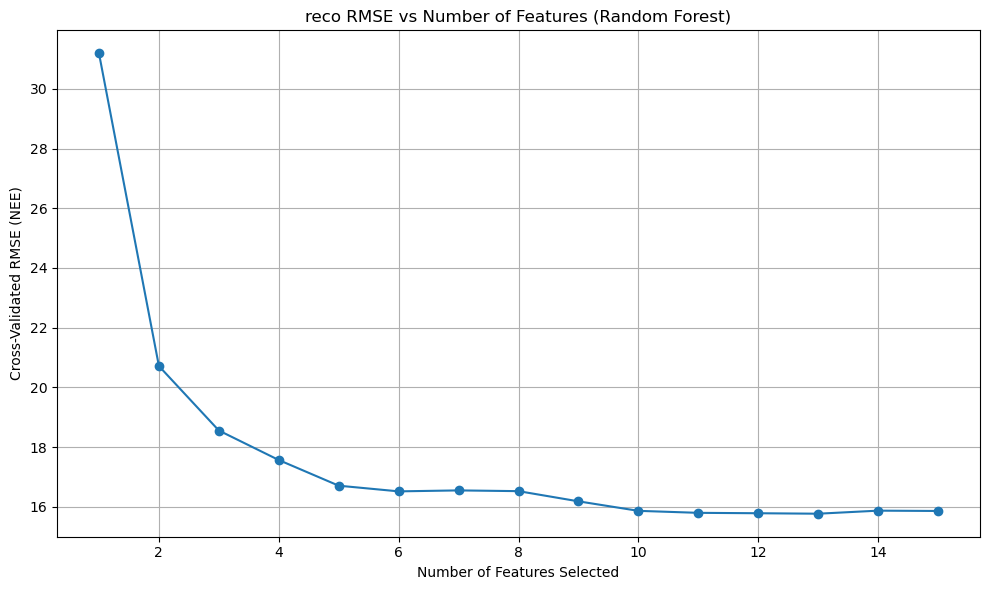

Optimal number of features: 1
Selected features: ['tmean_C']


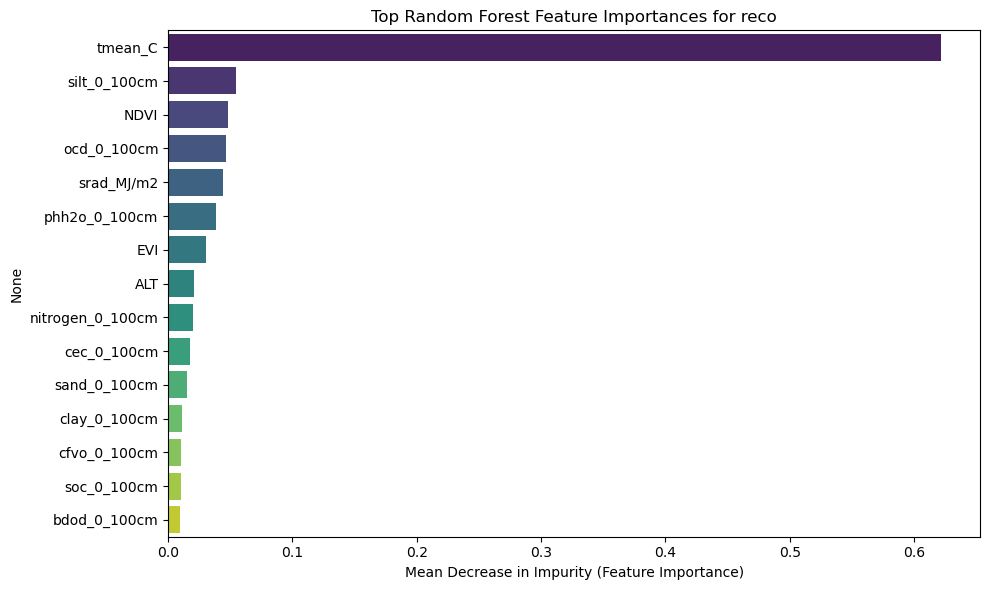

In [5]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFECV
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, make_scorer
import warnings
import os
warnings.filterwarnings('ignore')

# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil.csv")  

#fill nan with 0 for alt years 1997-2021
# 1. Print the count of NaN values before the operation
nans_before = df['ALT'].isna().sum()

# 2. Define the condition for the years 1997-2021
time_interval_mask = (df['year'] >= 1997) & (df['year'] <= 2021)

# 3. Fill NaN values in the 'ALT' column with 0 ONLY for the specified years
# We use .loc[mask, column] to modify the slice of the DataFrame
df.loc[time_interval_mask, 'ALT'] = df.loc[time_interval_mask, 'ALT'].fillna(2000)


# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
predictor_vars = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']
target_var = 'reco'

out_path = os.path.join("/explore/nobackup/people/spotter5/anna_v/v2/loocv", target_var)
os.makedirs(out_path, exist_ok = True)

# 4. Drop rows with missing predictor or target values
df_model = df[predictor_vars + [target_var]].dropna()

# 5. Prepare input data
X = df_model[predictor_vars]
y = df_model[target_var]

# 6. Set up scoring, model, and cross-validation
rmse_scorer = make_scorer(mean_squared_error, squared=False)
rf = RandomForestRegressor(n_estimators=500, random_state=42, n_jobs=-1)
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# 7. Run RFECV
rfecv = RFECV(estimator=rf, step=1, cv=cv, scoring=rmse_scorer, n_jobs=-1)
rfecv.fit(X, y)

# 8. Plot RMSE vs number of features
plt.figure(figsize=(10, 6))
plt.plot(
    range(1, len(rfecv.cv_results_['mean_test_score']) + 1),
    rfecv.cv_results_['mean_test_score'],
    marker='o'
)
plt.xlabel("Number of Features Selected")
plt.ylabel("Cross-Validated RMSE (NEE)")
plt.title(f"{target_var} RMSE vs Number of Features (Random Forest)")
plt.grid(True)
plt.tight_layout()
plt.savefig(os.path.join(out_path, 'rfe_soil_alt.png'))
plt.show()

# 9. Print selected features
selected_features = list(X.columns[rfecv.support_])
print("Optimal number of features:", rfecv.n_features_)
print("Selected features:", selected_features)

# 10. Train full model and compute feature importances
full_rf = RandomForestRegressor(n_estimators=500, random_state=42, n_jobs=-1)
full_rf.fit(X, y)
full_importances = pd.Series(full_rf.feature_importances_, index=X.columns)
top_10_features = full_importances.sort_values(ascending=False).head(20)

# 11. Plot feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x=top_10_features.values, y=top_10_features.index, palette="viridis")
plt.xlabel("Mean Decrease in Impurity (Feature Importance)")
plt.title(f"Top Random Forest Feature Importances for {target_var}")
plt.savefig(os.path.join(out_path, 'rf_importance_soil_alt.png'))
plt.tight_layout()
plt.show()

RFE CH4

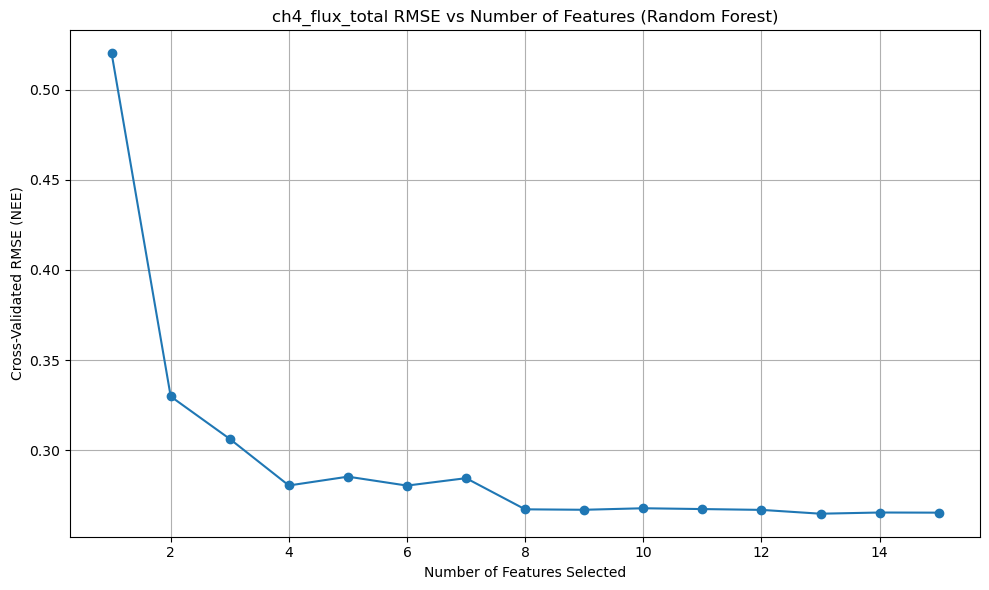

Optimal number of features: 1
Selected features: ['soc_0_100cm']


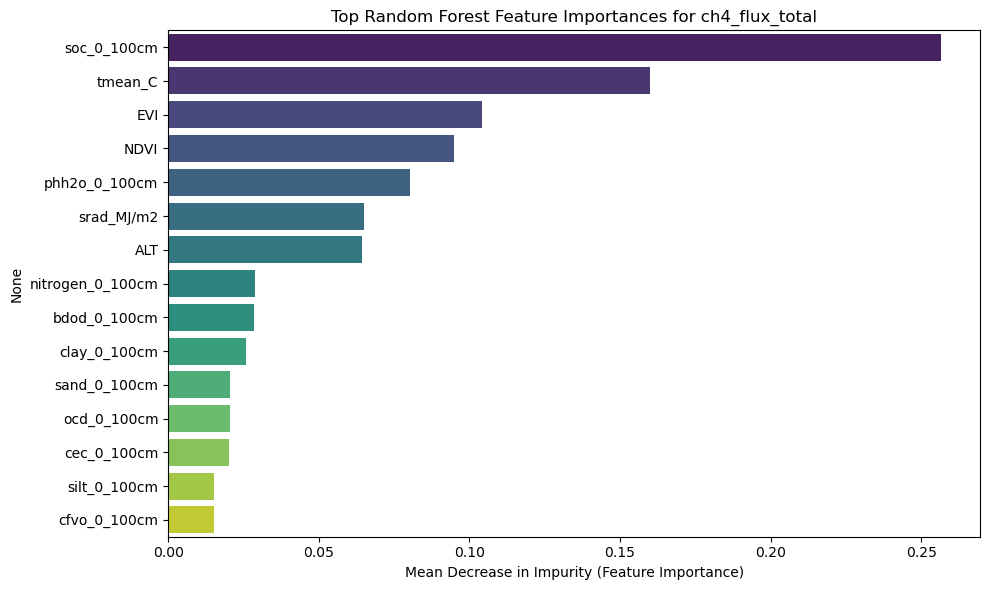

In [6]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFECV
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, make_scorer
import warnings
import os
warnings.filterwarnings('ignore')


# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil.csv")  

#fill nan with 0 for alt years 1997-2021
# 1. Print the count of NaN values before the operation
nans_before = df['ALT'].isna().sum()

# 2. Define the condition for the years 1997-2021
time_interval_mask = (df['year'] >= 1997) & (df['year'] <= 2021)

# 3. Fill NaN values in the 'ALT' column with 0 ONLY for the specified years
# We use .loc[mask, column] to modify the slice of the DataFrame
df.loc[time_interval_mask, 'ALT'] = df.loc[time_interval_mask, 'ALT'].fillna(2000)


# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
predictor_vars = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']
target_var = 'ch4_flux_total'

out_path = os.path.join("/explore/nobackup/people/spotter5/anna_v/v2/loocv", target_var)
os.makedirs(out_path, exist_ok = True)

# 4. Drop rows with missing predictor or target values
df_model = df[predictor_vars + [target_var]].dropna()

# 5. Prepare input data
X = df_model[predictor_vars]
y = df_model[target_var]

# 6. Set up scoring, model, and cross-validation
rmse_scorer = make_scorer(mean_squared_error, squared=False)
rf = RandomForestRegressor(n_estimators=500, random_state=42, n_jobs=-1)
cv = KFold(n_splits=5, shuffle=True, random_state=42)

# 7. Run RFECV
rfecv = RFECV(estimator=rf, step=1, cv=cv, scoring=rmse_scorer, n_jobs=-1)
rfecv.fit(X, y)

# 8. Plot RMSE vs number of features
plt.figure(figsize=(10, 6))
plt.plot(
    range(1, len(rfecv.cv_results_['mean_test_score']) + 1),
    rfecv.cv_results_['mean_test_score'],
    marker='o'
)
plt.xlabel("Number of Features Selected")
plt.ylabel("Cross-Validated RMSE (NEE)")
plt.title(f"{target_var} RMSE vs Number of Features (Random Forest)")
plt.grid(True)
plt.tight_layout()
plt.savefig(os.path.join(out_path, 'rfe_soil_alt.png'))
plt.show()

# 9. Print selected features
selected_features = list(X.columns[rfecv.support_])
print("Optimal number of features:", rfecv.n_features_)
print("Selected features:", selected_features)

# 10. Train full model and compute feature importances
full_rf = RandomForestRegressor(n_estimators=500, random_state=42, n_jobs=-1)
full_rf.fit(X, y)
full_importances = pd.Series(full_rf.feature_importances_, index=X.columns)
top_10_features = full_importances.sort_values(ascending=False).head(20)

# 11. Plot feature importances
plt.figure(figsize=(10, 6))
sns.barplot(x=top_10_features.values, y=top_10_features.index, palette="viridis")
plt.xlabel("Mean Decrease in Impurity (Feature Importance)")
plt.title(f"Top Random Forest Feature Importances for {target_var}")
plt.savefig(os.path.join(out_path, 'rf_importance_soil_alt.png'))
plt.tight_layout()
plt.show()

GPP 10-fold CV XGboost no dummy variables for LC

In [7]:
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import KFold, GridSearchCV, cross_val_score
from sklearn.metrics import mean_absolute_error, r2_score, make_scorer
import warnings
# warnings.filterwarnings('ignore')
warnings.filterwarnings("ignore", category=FutureWarning)
# 1. Load and prepare the data
# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil.csv")  

#fill nan with 0 for alt years 1997-2021
# 1. Print the count of NaN values before the operation
nans_before = df['ALT'].isna().sum()

# 2. Define the condition for the years 1997-2021
time_interval_mask = (df['year'] >= 1997) & (df['year'] <= 2021)

# 3. Fill NaN values in the 'ALT' column with 0 ONLY for the specified years
# We use .loc[mask, column] to modify the slice of the DataFrame
df.loc[time_interval_mask, 'ALT'] = df.loc[time_interval_mask, 'ALT'].fillna(2000)


# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
predictor_vars = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']

target_var = 'gpp'

# 3. Drop NA
df_model = df[predictor_vars + [target_var]].dropna()
X = df_model[predictor_vars]
y = df_model[target_var]

# 4. Define parameter grid
param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.001, 0.01, 0.05, 0.1],
    'subsample': [0.7, 1.0],
    'colsample_bytree': [0.7, 1.0],
    'n_estimators': [500]
}

# 5. Initialize model and 10-fold CV
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# 6. Grid search for RMSE
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    cv=cv,
    scoring='neg_root_mean_squared_error',
    n_jobs=-1
)

grid_search.fit(X, y)
best_rmse = -grid_search.best_score_
best_params = grid_search.best_params_

print(f"✅ Best RMSE: {best_rmse:.3f}")
print("✅ Best Parameters:", best_params)

# 7. Cross-validated R²
r2_scores = cross_val_score(
    grid_search.best_estimator_,
    X,
    y,
    scoring='r2',
    cv=cv,
    n_jobs=-1
)
print(f"✅ 10-Fold CV R²: {np.mean(r2_scores):.3f} ± {np.std(r2_scores):.3f}")

# 8. Cross-validated MAE
mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)
mae_scores = cross_val_score(
    grid_search.best_estimator_,
    X,
    y,
    scoring=mae_scorer,
    cv=cv,
    n_jobs=-1
)
print(f"✅ 10-Fold CV MAE: {-np.mean(mae_scores):.3f} ± {np.std(mae_scores):.3f}")


/home/spotter5/.conda/envs/deeplearning3/lib/python3.10/site-packages/xgboost/core.py:377: FutureWarning: Your system has an old version of glibc (< 2.28). We will stop supporting Linux distros with glibc older than 2.28 after **May 31, 2025**. Please upgrade to a recent Linux distro (with glibc >= 2.28) to use future versions of XGBoost.
Note: You have installed the 'manylinux2014' variant of XGBoost. Certain features such as GPU algorithms or federated learning are not available. To use these features, please upgrade to a recent Linux distro with glibc 2.28+, and install the 'manylinux_2_28' variant.
  warnings.warn(
/home/spotter5/.conda/envs/deeplearning3/lib/python3.10/site-packages/xgboost/core.py:377: FutureWarning: Your system has an old version of glibc (< 2.28). We will stop supporting Linux distros with glibc older than 2.28 after **May 31, 2025**. Please upgrade to a recent Linux distro (with glibc >= 2.28) to use future versions of XGBoost.
Note: You have installed the 'ma

✅ Best RMSE: 17.330
✅ Best Parameters: {'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 500, 'subsample': 1.0}
✅ 10-Fold CV R²: 0.929 ± 0.015
✅ 10-Fold CV MAE: 9.032 ± 0.631


GPP 10-fold CV XGboost dummy variables for LC

In [8]:
import os
import warnings
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import KFold, GridSearchCV, cross_val_score
from sklearn.metrics import mean_absolute_error, r2_score, make_scorer

# Suppress warnings
os.environ['PYTHONWARNINGS'] = 'ignore::FutureWarning'
warnings.filterwarnings("ignore", category=FutureWarning)

# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil.csv")  

#fill nan with 0 for alt years 1997-2021
# 1. Print the count of NaN values before the operation
nans_before = df['ALT'].isna().sum()

# 2. Define the condition for the years 1997-2021
time_interval_mask = (df['year'] >= 1997) & (df['year'] <= 2021)

# 3. Fill NaN values in the 'ALT' column with 0 ONLY for the specified years
# We use .loc[mask, column] to modify the slice of the DataFrame
df.loc[time_interval_mask, 'ALT'] = df.loc[time_interval_mask, 'ALT'].fillna(2000)


# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
predictor_vars = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']
target_var = 'gpp'

# 3. Drop rows with missing values in predictors, target, or 'bawld_class'
df_model = df[predictor_vars + ['bawld_class', target_var]].dropna()

# 4. One-hot encode bawld_class
df_dummies = pd.get_dummies(df_model['bawld_class'], prefix='bawld')
X = pd.concat([df_model[predictor_vars], df_dummies], axis=1)
y = df_model[target_var]

# 5. Define parameter grid
param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.001, 0.01, 0.05, 0.1],
    'subsample': [0.7, 1.0],
    'colsample_bytree': [0.7, 1.0],
    'n_estimators': [500]
}

# 6. Model and 10-fold CV
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# 7. Grid search (optimize RMSE)
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    cv=cv,
    scoring='neg_root_mean_squared_error',
    n_jobs=-1
)
grid_search.fit(X, y)

# 8. Metrics
best_rmse = -grid_search.best_score_
best_params = grid_search.best_params_
print(f"✅ Best RMSE: {best_rmse:.3f}")
print("✅ Best Parameters:", best_params)

# 9. R²
r2_scores = cross_val_score(
    grid_search.best_estimator_,
    X,
    y,
    scoring='r2',
    cv=cv,
    n_jobs=-1
)
print(f"✅ 10-Fold CV R²: {np.mean(r2_scores):.3f} ± {np.std(r2_scores):.3f}")

# 10. MAE
mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)
mae_scores = cross_val_score(
    grid_search.best_estimator_,
    X,
    y,
    scoring=mae_scorer,
    cv=cv,
    n_jobs=-1
)
print(f"✅ 10-Fold CV MAE: {-np.mean(mae_scores):.3f} ± {np.std(mae_scores):.3f}")


✅ Best RMSE: 17.358
✅ Best Parameters: {'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 500, 'subsample': 1.0}
✅ 10-Fold CV R²: 0.928 ± 0.015
✅ 10-Fold CV MAE: 8.940 ± 0.705


                                                 Site        RMSE        MAE   
0   Manitoba - Northern Old Black Spruce (former B...   35.466343  20.234700  \
1   Saskatchewan - Western Boreal, Mature Aspen_CA...   84.262262  49.898224   
2   Saskatchewan - Western Boreal, Mature Black Sp...   21.229940  16.832149   
3                     UCI-1930 burn site_CA-NS2_tower   35.849078  22.216196   
4                     UCI-1964 burn site_CA-NS3_tower   33.234922  26.128298   
..                                                ...         ...        ...   
87              Wolf_creek_upper_forest_CA-WCUF_tower   14.437412  12.628542   
88                                 Disko_GL-Dsk_tower   41.076150  29.257877   
89                         Lily Lake Fen_US-KPL_tower   29.172174  25.545673   
90                Abisko Stordalen birch forest_tower   10.918100   8.874408   
91                     North Star Yedoma_US-NSY_tower  103.781035  88.223961   

          R2  
0   0.773742  
1   0.579

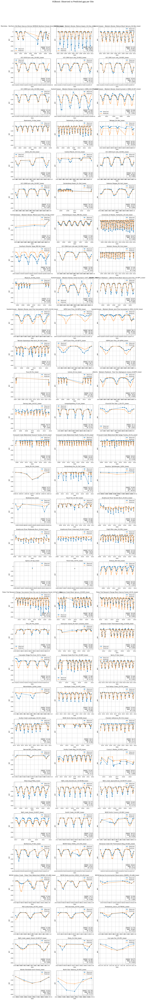

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import OneHotEncoder



# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil.csv")  

#fill nan with 0 for alt years 1997-2021
# 1. Print the count of NaN values before the operation
nans_before = df['ALT'].isna().sum()

# 2. Define the condition for the years 1997-2021
time_interval_mask = (df['year'] >= 1997) & (df['year'] <= 2021)

# 3. Fill NaN values in the 'ALT' column with 0 ONLY for the specified years
# We use .loc[mask, column] to modify the slice of the DataFrame
df.loc[time_interval_mask, 'ALT'] = df.loc[time_interval_mask, 'ALT'].fillna(2000)


# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
feature_cols = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']
target_col = 'gpp'
df = df.dropna(subset=['site_reference', 'date'] + feature_cols + ['bawld_class', target_col])

out_path = os.path.join("/explore/nobackup/people/spotter5/anna_v/v2/loocv", target_col)
os.makedirs(out_path, exist_ok = True)

# One-hot encode 'bawld_class'
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')
bawld_encoded = encoder.fit_transform(df[['bawld_class']])
bawld_cols = encoder.get_feature_names_out(['bawld_class'])
bawld_df = pd.DataFrame(bawld_encoded, columns=bawld_cols, index=df.index)

# Combine features
X = pd.concat([df[feature_cols], bawld_df], axis=1)
y = df[target_col]
sites = df["site_reference"].unique()

results = []
all_preds_df = []

# Leave-One-Site-Out CV
for test_site in sites:
    train_idx = df["site_reference"] != test_site
    test_idx = df["site_reference"] == test_site

    if test_idx.sum() < 1:
        continue

    X_train, y_train = X.loc[train_idx], y.loc[train_idx]
    X_test, y_test = X.loc[test_idx], y.loc[test_idx]
    dates_test = df.loc[test_idx, "date"]

    model = XGBRegressor(
        n_estimators=700,
        learning_rate=0.01,
        max_depth=3,
        n_jobs=-1,
        subsample = 0.7,
        random_state=42,
        verbosity=0
    )
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    site_df = pd.DataFrame({
        "Site": test_site,
        "Date": dates_test.values,
        "Observed": y_test.values,
        "Predicted": y_pred
    })
    all_preds_df.append(site_df)

    # Metrics
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)

    results.append({
        "Site": test_site,
        "RMSE": rmse,
        "MAE": mae,
        "R2": r2
    })

# Combine results
results_df = pd.DataFrame(results)
all_preds_df = pd.concat(all_preds_df, ignore_index=True)

# Save to disk
results_df.to_csv(os.path.join(out_path, f'xgb_results_{target_col}_soil_alt.csv'), index=False)
all_preds_df.to_csv(os.path.join(out_path, f'xgb_predictions_{target_col}_soil_alt.csv'), index=False)

# Pooled metrics
rmse_all = np.sqrt(mean_squared_error(all_preds_df["Observed"], all_preds_df["Predicted"]))
r2_all = r2_score(all_preds_df["Observed"], all_preds_df["Predicted"])
mae_all = mean_absolute_error(all_preds_df["Observed"], all_preds_df["Predicted"])

print(results_df)
print("\nPooled RMSE:", rmse_all)
print("Pooled MAE: ", mae_all)
print("Pooled R²:  ", r2_all)

# Mean metrics across sites
mean_rmse = results_df["RMSE"].median()
mean_mae = results_df["MAE"].median()
mean_r2 = results_df["R2"].median()

print("\nMean RMSE across sites:", mean_rmse)
print("Mean MAE across sites: ", mean_mae)
print("Mean R² across sites:  ", mean_r2)

# Time Series Plot
unique_sites = all_preds_df["Site"].unique()
ncols = 3
nrows = int(np.ceil(len(unique_sites) / ncols))
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 4 * nrows), sharex=False, sharey=True)
axs = axs.flatten()

# for i, site in enumerate(unique_sites):
#     site_df = all_preds_df[all_preds_df["Site"] == site].sort_values("Date")
#     axs[i].plot(site_df["Date"], site_df["Observed"], label="Observed", marker="o")
#     axs[i].plot(site_df["Date"], site_df["Predicted"], label="Predicted", marker="x")
#     axs[i].set_title(site)
#     axs[i].set_xlabel("Date")
#     axs[i].set_ylabel(f"{target_col}")
#     axs[i].legend()
#     axs[i].grid(True)

for i, site in enumerate(unique_sites):
    site_df = all_preds_df[all_preds_df["Site"] == site].sort_values("Date")
    site_metrics = results_df[results_df["Site"] == site].iloc[0]
    rmse_val = round(site_metrics["RMSE"], 2)
    r2_val = round(site_metrics["R2"], 2)
    mae_val = round(site_metrics["MAE"], 2)

    ax = axs[i]
    ax.plot(site_df["Date"], site_df["Observed"], label="Observed", marker="o")
    ax.plot(site_df["Date"], site_df["Predicted"], label="Predicted", marker="x")
    ax.set_title(site)
    ax.set_xlabel("Date")
    ax.set_ylabel(target_col)
    ax.legend()
    ax.grid(True)

    # ✅ Bottom-right metrics text
    textstr = f"RMSE: {rmse_val}\nMAE: {mae_val}\nR²: {r2_val}"
    ax.text(
        0.98, 0.05, textstr,
        transform=ax.transAxes,
        fontsize=12,
        verticalalignment='bottom',
        horizontalalignment='right',
        bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.6)
    )


# Remove extra axes
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

fig.suptitle(f"XGBoost: Observed vs Predicted {target_col} per Site", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(os.path.join(out_path, f'xgb_{target_col}_loso_soil_alts.png'))
plt.show()


NEE 10-fold CV XGboost dummy variables for LC

In [10]:
import os
import warnings
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import KFold, GridSearchCV, cross_val_score
from sklearn.metrics import mean_absolute_error, r2_score, make_scorer

# Suppress warnings
os.environ['PYTHONWARNINGS'] = 'ignore::FutureWarning'
warnings.filterwarnings("ignore", category=FutureWarning)

# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil.csv")  

#fill nan with 0 for alt years 1997-2021
# 1. Print the count of NaN values before the operation
nans_before = df['ALT'].isna().sum()

# 2. Define the condition for the years 1997-2021
time_interval_mask = (df['year'] >= 1997) & (df['year'] <= 2021)

# 3. Fill NaN values in the 'ALT' column with 0 ONLY for the specified years
# We use .loc[mask, column] to modify the slice of the DataFrame
df.loc[time_interval_mask, 'ALT'] = df.loc[time_interval_mask, 'ALT'].fillna(2000)


# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
predictor_vars = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']
target_var = 'nee'

# 3. Drop rows with missing values in predictors, target, or 'bawld_class'
df_model = df[predictor_vars + ['bawld_class', target_var]].dropna()

# 4. One-hot encode bawld_class
df_dummies = pd.get_dummies(df_model['bawld_class'], prefix='bawld')
X = pd.concat([df_model[predictor_vars], df_dummies], axis=1)
y = df_model[target_var]

# 5. Define parameter grid
param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.001, 0.01, 0.05, 0.1],
    'subsample': [0.7, 1.0],
    'colsample_bytree': [0.7, 1.0],
    'n_estimators': [500]
}

# 6. Model and 10-fold CV
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# 7. Grid search (optimize RMSE)
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    cv=cv,
    scoring='neg_root_mean_squared_error',
    n_jobs=-1
)
grid_search.fit(X, y)

# 8. Metrics
best_rmse = -grid_search.best_score_
best_params = grid_search.best_params_
print(f"✅ Best RMSE: {best_rmse:.3f}")
print("✅ Best Parameters:", best_params)

# 9. R²
r2_scores = cross_val_score(
    grid_search.best_estimator_,
    X,
    y,
    scoring='r2',
    cv=cv,
    n_jobs=-1
)
print(f"✅ 10-Fold CV R²: {np.mean(r2_scores):.3f} ± {np.std(r2_scores):.3f}")

# 10. MAE
mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)
mae_scores = cross_val_score(
    grid_search.best_estimator_,
    X,
    y,
    scoring=mae_scorer,
    cv=cv,
    n_jobs=-1
)
print(f"✅ 10-Fold CV MAE: {-np.mean(mae_scores):.3f} ± {np.std(mae_scores):.3f}")


✅ Best RMSE: 11.536
✅ Best Parameters: {'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 500, 'subsample': 1.0}
✅ 10-Fold CV R²: 0.855 ± 0.035
✅ 10-Fold CV MAE: 6.268 ± 0.362


                                                  Site       RMSE        MAE   
0    Manitoba - Northern Old Black Spruce (former B...  15.494613  10.633444  \
1    Saskatchewan - Western Boreal, Mature Aspen_CA...  44.773072  33.580237   
2    Saskatchewan - Western Boreal, Mature Black Sp...  15.220189  11.000650   
3    Saskatchewan - Western Boreal, Mature Jack Pin...  24.151764  19.653952   
4                      UCI-1930 burn site_CA-NS2_tower  35.530862  25.271061   
..                                                 ...        ...        ...   
108                           Steen River_CA-STR_tower  26.065762  19.897129   
109                         Lily Lake Fen_US-KPL_tower  10.421046   7.824213   
110                Abisko Stordalen birch forest_tower   9.667623   8.242423   
111                     North Star Yedoma_US-NSY_tower  63.663945  53.786359   
112                                Lutose_CA-LUT_tower   5.145034   4.639605   

            R2  
0     0.536997  
1    

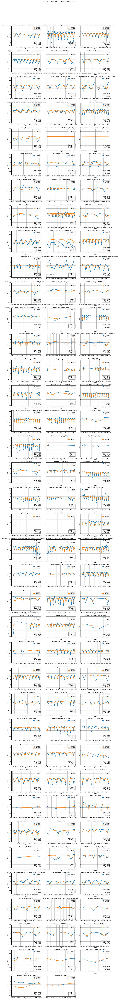

In [11]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import OneHotEncoder



# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil.csv")  

#fill nan with 0 for alt years 1997-2021
# 1. Print the count of NaN values before the operation
nans_before = df['ALT'].isna().sum()

# 2. Define the condition for the years 1997-2021
time_interval_mask = (df['year'] >= 1997) & (df['year'] <= 2021)

# 3. Fill NaN values in the 'ALT' column with 0 ONLY for the specified years
# We use .loc[mask, column] to modify the slice of the DataFrame
df.loc[time_interval_mask, 'ALT'] = df.loc[time_interval_mask, 'ALT'].fillna(2000)


# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
feature_cols = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']
target_col = 'nee'
df = df.dropna(subset=['site_reference', 'date'] + feature_cols + ['bawld_class', target_col])

out_path = os.path.join("/explore/nobackup/people/spotter5/anna_v/v2/loocv", target_col)
os.makedirs(out_path, exist_ok = True)

# One-hot encode 'bawld_class'
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')
bawld_encoded = encoder.fit_transform(df[['bawld_class']])
bawld_cols = encoder.get_feature_names_out(['bawld_class'])
bawld_df = pd.DataFrame(bawld_encoded, columns=bawld_cols, index=df.index)

# Combine features
X = pd.concat([df[feature_cols], bawld_df], axis=1)
y = df[target_col]
sites = df["site_reference"].unique()

results = []
all_preds_df = []

# Leave-One-Site-Out CV
for test_site in sites:
    train_idx = df["site_reference"] != test_site
    test_idx = df["site_reference"] == test_site

    if test_idx.sum() < 1:
        continue

    X_train, y_train = X.loc[train_idx], y.loc[train_idx]
    X_test, y_test = X.loc[test_idx], y.loc[test_idx]
    dates_test = df.loc[test_idx, "date"]

    model = XGBRegressor(
        n_estimators=700,
        learning_rate=0.01,
        max_depth=3,
        n_jobs=-1,
        subsample = 0.7,
        random_state=42,
        verbosity=0
    )
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    site_df = pd.DataFrame({
        "Site": test_site,
        "Date": dates_test.values,
        "Observed": y_test.values,
        "Predicted": y_pred
    })
    all_preds_df.append(site_df)

    # Metrics
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)

    results.append({
        "Site": test_site,
        "RMSE": rmse,
        "MAE": mae,
        "R2": r2
    })

# Combine results
results_df = pd.DataFrame(results)
all_preds_df = pd.concat(all_preds_df, ignore_index=True)

# Save to disk
results_df.to_csv(os.path.join(out_path, f'xgb_results_{target_col}_soil_alt.csv'), index=False)
all_preds_df.to_csv(os.path.join(out_path, f'xgb_predictions_{target_col}_soil_alt.csv'), index=False)

# Pooled metrics
rmse_all = np.sqrt(mean_squared_error(all_preds_df["Observed"], all_preds_df["Predicted"]))
r2_all = r2_score(all_preds_df["Observed"], all_preds_df["Predicted"])
mae_all = mean_absolute_error(all_preds_df["Observed"], all_preds_df["Predicted"])

print(results_df)
print("\nPooled RMSE:", rmse_all)
print("Pooled MAE: ", mae_all)
print("Pooled R²:  ", r2_all)

# Mean metrics across sites
mean_rmse = results_df["RMSE"].median()
mean_mae = results_df["MAE"].median()
mean_r2 = results_df["R2"].median()

print("\nMean RMSE across sites:", mean_rmse)
print("Mean MAE across sites: ", mean_mae)
print("Mean R² across sites:  ", mean_r2)


# Time Series Plot
unique_sites = all_preds_df["Site"].unique()
ncols = 3
nrows = int(np.ceil(len(unique_sites) / ncols))
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 4 * nrows), sharex=False, sharey=True)
axs = axs.flatten()

# for i, site in enumerate(unique_sites):
#     site_df = all_preds_df[all_preds_df["Site"] == site].sort_values("Date")
#     axs[i].plot(site_df["Date"], site_df["Observed"], label="Observed", marker="o")
#     axs[i].plot(site_df["Date"], site_df["Predicted"], label="Predicted", marker="x")
#     axs[i].set_title(site)
#     axs[i].set_xlabel("Date")
#     axs[i].set_ylabel(f"{target_col}")
#     axs[i].legend()
#     axs[i].grid(True)

for i, site in enumerate(unique_sites):
    site_df = all_preds_df[all_preds_df["Site"] == site].sort_values("Date")
    site_metrics = results_df[results_df["Site"] == site].iloc[0]
    rmse_val = round(site_metrics["RMSE"], 2)
    r2_val = round(site_metrics["R2"], 2)
    mae_val = round(site_metrics["MAE"], 2)

    ax = axs[i]
    ax.plot(site_df["Date"], site_df["Observed"], label="Observed", marker="o")
    ax.plot(site_df["Date"], site_df["Predicted"], label="Predicted", marker="x")
    ax.set_title(site)
    ax.set_xlabel("Date")
    ax.set_ylabel(target_col)
    ax.legend()
    ax.grid(True)

    # ✅ Bottom-right metrics text
    textstr = f"RMSE: {rmse_val}\nMAE: {mae_val}\nR²: {r2_val}"
    ax.text(
        0.98, 0.05, textstr,
        transform=ax.transAxes,
        fontsize=12,
        verticalalignment='bottom',
        horizontalalignment='right',
        bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.6)
    )

# Remove extra axes
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

fig.suptitle(f"XGBoost: Observed vs Predicted {target_col} per Site", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(os.path.join(out_path, f'xgb_{target_col}_loso_soil_alt.png'))
plt.show()


RECO 10-fold CV XGboost dummy variables for LC

In [12]:
import os
import warnings
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import KFold, GridSearchCV, cross_val_score
from sklearn.metrics import mean_absolute_error, r2_score, make_scorer

# Suppress warnings
os.environ['PYTHONWARNINGS'] = 'ignore::FutureWarning'
warnings.filterwarnings("ignore", category=FutureWarning)

# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil.csv")  

#fill nan with 0 for alt years 1997-2021
# 1. Print the count of NaN values before the operation
nans_before = df['ALT'].isna().sum()

# 2. Define the condition for the years 1997-2021
time_interval_mask = (df['year'] >= 1997) & (df['year'] <= 2021)

# 3. Fill NaN values in the 'ALT' column with 0 ONLY for the specified years
# We use .loc[mask, column] to modify the slice of the DataFrame
df.loc[time_interval_mask, 'ALT'] = df.loc[time_interval_mask, 'ALT'].fillna(2000)


# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
predictor_vars =['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']
target_var = 'reco'

# 3. Drop rows with missing values in predictors, target, or 'bawld_class'
df_model = df[predictor_vars + ['bawld_class', target_var]].dropna()

# 4. One-hot encode bawld_class
df_dummies = pd.get_dummies(df_model['bawld_class'], prefix='bawld')
X = pd.concat([df_model[predictor_vars], df_dummies], axis=1)
y = df_model[target_var]

# 5. Define parameter grid
param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.001, 0.01, 0.05, 0.1],
    'subsample': [0.7, 1.0],
    'colsample_bytree': [0.7, 1.0],
    'n_estimators': [500]
}

# 6. Model and 10-fold CV
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# 7. Grid search (optimize RMSE)
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    cv=cv,
    scoring='neg_root_mean_squared_error',
    n_jobs=-1
)
grid_search.fit(X, y)

# 8. Metrics
best_rmse = -grid_search.best_score_
best_params = grid_search.best_params_
print(f"✅ Best RMSE: {best_rmse:.3f}")
print("✅ Best Parameters:", best_params)

# 9. R²
r2_scores = cross_val_score(
    grid_search.best_estimator_,
    X,
    y,
    scoring='r2',
    cv=cv,
    n_jobs=-1
)
print(f"✅ 10-Fold CV R²: {np.mean(r2_scores):.3f} ± {np.std(r2_scores):.3f}")

# 10. MAE
mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)
mae_scores = cross_val_score(
    grid_search.best_estimator_,
    X,
    y,
    scoring=mae_scorer,
    cv=cv,
    n_jobs=-1
)
print(f"✅ 10-Fold CV MAE: {-np.mean(mae_scores):.3f} ± {np.std(mae_scores):.3f}")


✅ Best RMSE: 13.364
✅ Best Parameters: {'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 7, 'n_estimators': 500, 'subsample': 1.0}
✅ 10-Fold CV R²: 0.916 ± 0.021
✅ 10-Fold CV MAE: 7.083 ± 0.597


                                                 Site        RMSE         MAE   
0   Manitoba - Northern Old Black Spruce (former B...   47.246581   23.817433  \
1   Saskatchewan - Western Boreal, Mature Aspen_CA...   45.235923   35.778947   
2   Saskatchewan - Western Boreal, Mature Black Sp...   15.590094   12.628820   
3   Saskatchewan - Western Boreal, Mature Jack Pin...   16.396962   11.221685   
4                     UCI-1930 burn site_CA-NS2_tower   24.814735   19.712100   
..                                                ...         ...         ...   
89              Wolf_creek_upper_forest_CA-WCUF_tower   18.871587   13.053410   
90                                 Disko_GL-Dsk_tower   11.441637    8.424346   
91                         Lily Lake Fen_US-KPL_tower   24.838221   22.379714   
92                Abisko Stordalen birch forest_tower   16.957865   16.414361   
93                     North Star Yedoma_US-NSY_tower  151.152380  123.985579   

          R2  
0   0.494686

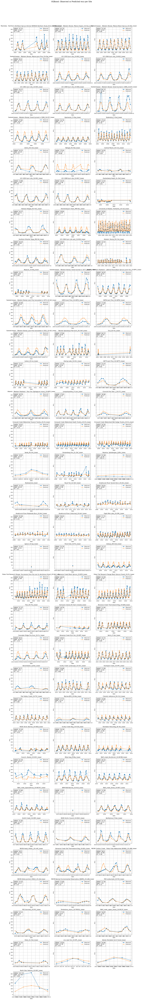

In [13]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import OneHotEncoder



# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil.csv")  

#fill nan with 0 for alt years 1997-2021
# 1. Print the count of NaN values before the operation
nans_before = df['ALT'].isna().sum()

# 2. Define the condition for the years 1997-2021
time_interval_mask = (df['year'] >= 1997) & (df['year'] <= 2021)

# 3. Fill NaN values in the 'ALT' column with 0 ONLY for the specified years
# We use .loc[mask, column] to modify the slice of the DataFrame
df.loc[time_interval_mask, 'ALT'] = df.loc[time_interval_mask, 'ALT'].fillna(2000)


# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
feature_cols = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']
target_col = 'reco'
df = df.dropna(subset=['site_reference', 'date'] + feature_cols + ['bawld_class', target_col])

out_path = os.path.join("/explore/nobackup/people/spotter5/anna_v/v2/loocv", target_col)
os.makedirs(out_path, exist_ok = True)

# One-hot encode 'bawld_class'
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')
bawld_encoded = encoder.fit_transform(df[['bawld_class']])
bawld_cols = encoder.get_feature_names_out(['bawld_class'])
bawld_df = pd.DataFrame(bawld_encoded, columns=bawld_cols, index=df.index)

# Combine features
X = pd.concat([df[feature_cols], bawld_df], axis=1)
y = df[target_col]
sites = df["site_reference"].unique()

results = []
all_preds_df = []

# Leave-One-Site-Out CV
for test_site in sites:
    train_idx = df["site_reference"] != test_site
    test_idx = df["site_reference"] == test_site

    if test_idx.sum() < 1:
        continue

    X_train, y_train = X.loc[train_idx], y.loc[train_idx]
    X_test, y_test = X.loc[test_idx], y.loc[test_idx]
    dates_test = df.loc[test_idx, "date"]

    model = XGBRegressor(
        n_estimators=700,
        learning_rate=0.01,
        max_depth=3,
        n_jobs=-1,
        subsample = 0.7,
        random_state=42,
        verbosity=0
    )
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    site_df = pd.DataFrame({
        "Site": test_site,
        "Date": dates_test.values,
        "Observed": y_test.values,
        "Predicted": y_pred
    })
    all_preds_df.append(site_df)

    # Metrics
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)

    results.append({
        "Site": test_site,
        "RMSE": rmse,
        "MAE": mae,
        "R2": r2
    })

# Combine results
results_df = pd.DataFrame(results)
all_preds_df = pd.concat(all_preds_df, ignore_index=True)

# Save to disk
results_df.to_csv(os.path.join(out_path, f'xgb_results_{target_col}_soil_alt.csv'), index=False)
all_preds_df.to_csv(os.path.join(out_path, f'xgb_predictions_{target_col}_soil_alt.csv'), index=False)

# Pooled metrics
rmse_all = np.sqrt(mean_squared_error(all_preds_df["Observed"], all_preds_df["Predicted"]))
r2_all = r2_score(all_preds_df["Observed"], all_preds_df["Predicted"])
mae_all = mean_absolute_error(all_preds_df["Observed"], all_preds_df["Predicted"])

print(results_df)
print("\nPooled RMSE:", rmse_all)
print("Pooled MAE: ", mae_all)
print("Pooled R²:  ", r2_all)

# Mean metrics across sites
mean_rmse = results_df["RMSE"].median()
mean_mae = results_df["MAE"].median()
mean_r2 = results_df["R2"].median()

print("\nMean RMSE across sites:", mean_rmse)
print("Mean MAE across sites: ", mean_mae)
print("Mean R² across sites:  ", mean_r2)


# Time Series Plot
unique_sites = all_preds_df["Site"].unique()
ncols = 3
nrows = int(np.ceil(len(unique_sites) / ncols))
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 4 * nrows), sharex=False, sharey=True)
axs = axs.flatten()

# for i, site in enumerate(unique_sites):
#     site_df = all_preds_df[all_preds_df["Site"] == site].sort_values("Date")
#     axs[i].plot(site_df["Date"], site_df["Observed"], label="Observed", marker="o")
#     axs[i].plot(site_df["Date"], site_df["Predicted"], label="Predicted", marker="x")
#     axs[i].set_title(site)
#     axs[i].set_xlabel("Date")
#     axs[i].set_ylabel(f"{target_col}")
#     axs[i].legend()
#     axs[i].grid(True)

for i, site in enumerate(unique_sites):
    site_df = all_preds_df[all_preds_df["Site"] == site].sort_values("Date")
    site_metrics = results_df[results_df["Site"] == site].iloc[0]
    rmse_val = round(site_metrics["RMSE"], 2)
    r2_val = round(site_metrics["R2"], 2)
    mae_val = round(site_metrics["MAE"], 2)

    ax = axs[i]
    ax.plot(site_df["Date"], site_df["Observed"], label="Observed", marker="o")
    ax.plot(site_df["Date"], site_df["Predicted"], label="Predicted", marker="x")
    ax.set_title(site)
    ax.set_xlabel("Date")
    ax.set_ylabel(target_col)
    ax.legend()
    ax.grid(True)

    # ✅ Bottom-right metrics text
    textstr = f"RMSE: {rmse_val}\nMAE: {mae_val}\nR²: {r2_val}"
    ax.text(
        0.02, 0.95, textstr,
        transform=ax.transAxes,
        fontsize=12,
        verticalalignment='top',
        horizontalalignment='left',
        bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.6)
    )

# Remove extra axes
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

fig.suptitle(f"XGBoost: Observed vs Predicted {target_col} per Site", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(os.path.join(out_path, f'xgb_{target_col}_loso_soil_alt.png'))
plt.show()


CH4 10-fold CV XGboost dummy variables for LC

In [14]:
import os
import warnings
import pandas as pd
import numpy as np
from xgboost import XGBRegressor
from sklearn.model_selection import KFold, GridSearchCV, cross_val_score
from sklearn.metrics import mean_absolute_error, r2_score, make_scorer

# Suppress warnings
os.environ['PYTHONWARNINGS'] = 'ignore::FutureWarning'
warnings.filterwarnings("ignore", category=FutureWarning)

# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil.csv")  

#fill nan with 0 for alt years 1997-2021
# 1. Print the count of NaN values before the operation
nans_before = df['ALT'].isna().sum()

# 2. Define the condition for the years 1997-2021
time_interval_mask = (df['year'] >= 1997) & (df['year'] <= 2021)

# 3. Fill NaN values in the 'ALT' column with 0 ONLY for the specified years
# We use .loc[mask, column] to modify the slice of the DataFrame
df.loc[time_interval_mask, 'ALT'] = df.loc[time_interval_mask, 'ALT'].fillna(2000)


# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
predictor_vars = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']

target_var = 'ch4_flux_total'

# 3. Drop rows with missing values in predictors, target, or 'bawld_class'
df_model = df[predictor_vars + ['bawld_class', target_var]].dropna()

# 4. One-hot encode bawld_class
df_dummies = pd.get_dummies(df_model['bawld_class'], prefix='bawld')
X = pd.concat([df_model[predictor_vars], df_dummies], axis=1)
y = df_model[target_var]

# 5. Define parameter grid
param_grid = {
    'max_depth': [3, 5, 7],
    'learning_rate': [0.001, 0.01, 0.05, 0.1],
    'subsample': [0.7, 1.0],
    'colsample_bytree': [0.7, 1.0],
    'n_estimators': [500]
}

# 6. Model and 10-fold CV
xgb_model = XGBRegressor(random_state=42, n_jobs=-1)
cv = KFold(n_splits=10, shuffle=True, random_state=42)

# 7. Grid search (optimize RMSE)
grid_search = GridSearchCV(
    estimator=xgb_model,
    param_grid=param_grid,
    cv=cv,
    scoring='neg_root_mean_squared_error',
    n_jobs=-1
)
grid_search.fit(X, y)

# 8. Metrics
best_rmse = -grid_search.best_score_
best_params = grid_search.best_params_
print(f"✅ Best RMSE: {best_rmse:.3f}")
print("✅ Best Parameters:", best_params)

# 9. R²
r2_scores = cross_val_score(
    grid_search.best_estimator_,
    X,
    y,
    scoring='r2',
    cv=cv,
    n_jobs=-1
)
print(f"✅ 10-Fold CV R²: {np.mean(r2_scores):.3f} ± {np.std(r2_scores):.3f}")

# 10. MAE
mae_scorer = make_scorer(mean_absolute_error, greater_is_better=False)
mae_scores = cross_val_score(
    grid_search.best_estimator_,
    X,
    y,
    scoring=mae_scorer,
    cv=cv,
    n_jobs=-1
)
print(f"✅ 10-Fold CV MAE: {-np.mean(mae_scores):.3f} ± {np.std(mae_scores):.3f}")


✅ Best RMSE: 0.187
✅ Best Parameters: {'colsample_bytree': 0.7, 'learning_rate': 0.1, 'max_depth': 5, 'n_estimators': 500, 'subsample': 0.7}
✅ 10-Fold CV R²: 0.937 ± 0.011
✅ 10-Fold CV MAE: 0.084 ± 0.011


                                                 Site      RMSE       MAE   
0                        Kytalyk, Russia_RU-Cok_tower  0.219120  0.176510  \
1                          Lompolojankka_FI-Lom_tower  1.825439  1.410622   
2                                   Rylekaerene_tower  1.710375  1.285244   
3                                  Seida_RU-Vrk_tower  1.234976  1.158512   
4                   Churchill Fen Site 2_CA-CF2_tower  0.776305  0.566985   
5        University of Alaska, Fairbanks_US-Uaf_tower  0.356083  0.297685   
6                     Trail Valley Creek_CA-TVC_tower  0.486987  0.456901   
7                 Scotty Creek Landscape_CA-SCC_tower  0.417978  0.341203   
8                     NGEE Arctic Barrow_US-NGB_tower  0.174598  0.144019   
9                     Cherskii reference_RU-Ch2_tower  0.709255  0.510719   
10                                Ivotuk_US-Ivo_tower  0.424588  0.318533   
11                            Barrow-BES_US-Bes_tower  0.343326  0.256196   

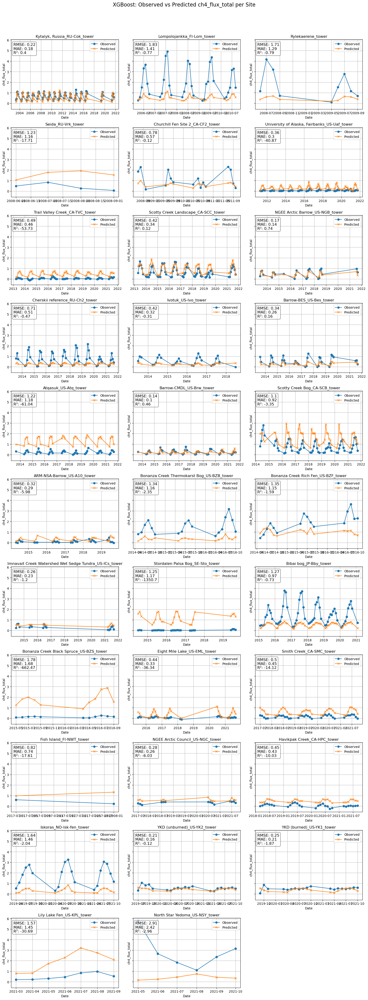

In [15]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from xgboost import XGBRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import OneHotEncoder

# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil.csv")  

#fill nan with 0 for alt years 1997-2021
# 1. Print the count of NaN values before the operation
nans_before = df['ALT'].isna().sum()

# 2. Define the condition for the years 1997-2021
time_interval_mask = (df['year'] >= 1997) & (df['year'] <= 2021)

# 3. Fill NaN values in the 'ALT' column with 0 ONLY for the specified years
# We use .loc[mask, column] to modify the slice of the DataFrame
df.loc[time_interval_mask, 'ALT'] = df.loc[time_interval_mask, 'ALT'].fillna(2000)


# 2. Create tmean_C and date
df['tmean_C'] = df[['tmax_C', 'tmin_C']].mean(axis=1)
df['date'] = pd.to_datetime(df[['year', 'month']].assign(day=1))

# 3. Define predictors and target
feature_cols = ['EVI', 'NDVI', 'srad_MJ/m2', 'tmean_C', 'bdod_0_100cm',
                  'cec_0_100cm', 'cfvo_0_100cm', 'clay_0_100cm', 'nitrogen_0_100cm',
                  'ocd_0_100cm','phh2o_0_100cm', 'sand_0_100cm', 'silt_0_100cm', 'soc_0_100cm', 'ALT']
target_col = 'ch4_flux_total'
df = df.dropna(subset=['site_reference', 'date'] + feature_cols + ['bawld_class', target_col])

out_path = os.path.join("/explore/nobackup/people/spotter5/anna_v/v2/loocv", target_col)
os.makedirs(out_path, exist_ok = True)

# One-hot encode 'bawld_class'
encoder = OneHotEncoder(sparse=False, handle_unknown='ignore')
bawld_encoded = encoder.fit_transform(df[['bawld_class']])
bawld_cols = encoder.get_feature_names_out(['bawld_class'])
bawld_df = pd.DataFrame(bawld_encoded, columns=bawld_cols, index=df.index)

# Combine features
X = pd.concat([df[feature_cols], bawld_df], axis=1)
y = df[target_col]
sites = df["site_reference"].unique()

results = []
all_preds_df = []

# Leave-One-Site-Out CV
for test_site in sites:
    train_idx = df["site_reference"] != test_site
    test_idx = df["site_reference"] == test_site

    if test_idx.sum() < 1:
        continue

    X_train, y_train = X.loc[train_idx], y.loc[train_idx]
    X_test, y_test = X.loc[test_idx], y.loc[test_idx]
    dates_test = df.loc[test_idx, "date"]

    model = XGBRegressor(
        n_estimators=700,
        learning_rate=0.01,
        max_depth=3,
        n_jobs=-1,
        subsample = 0.7,
        random_state=42,
        verbosity=0
    )
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    site_df = pd.DataFrame({
        "Site": test_site,
        "Date": dates_test.values,
        "Observed": y_test.values,
        "Predicted": y_pred
    })
    all_preds_df.append(site_df)

    # Metrics
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)

    results.append({
        "Site": test_site,
        "RMSE": rmse,
        "MAE": mae,
        "R2": r2
    })

# Combine results
results_df = pd.DataFrame(results)
all_preds_df = pd.concat(all_preds_df, ignore_index=True)

# Save to disk
results_df.to_csv(os.path.join(out_path, f'xgb_results_{target_col}_soil_alt.csv'), index=False)
all_preds_df.to_csv(os.path.join(out_path, f'xgb_predictions_{target_col}_soil_alt.csv'), index=False)

# Pooled metrics
rmse_all = np.sqrt(mean_squared_error(all_preds_df["Observed"], all_preds_df["Predicted"]))
r2_all = r2_score(all_preds_df["Observed"], all_preds_df["Predicted"])
mae_all = mean_absolute_error(all_preds_df["Observed"], all_preds_df["Predicted"])

print(results_df)
print("\nPooled RMSE:", rmse_all)
print("Pooled MAE: ", mae_all)
print("Pooled R²:  ", r2_all)

# Mean metrics across sites
mean_rmse = results_df["RMSE"].median()
mean_mae = results_df["MAE"].median()
mean_r2 = results_df["R2"].median()

print("\nMean RMSE across sites:", mean_rmse)
print("Mean MAE across sites: ", mean_mae)
print("Mean R² across sites:  ", mean_r2)


# Time Series Plot
unique_sites = all_preds_df["Site"].unique()
ncols = 3
nrows = int(np.ceil(len(unique_sites) / ncols))
fig, axs = plt.subplots(nrows=nrows, ncols=ncols, figsize=(16, 4 * nrows), sharex=False, sharey=True)
axs = axs.flatten()

# for i, site in enumerate(unique_sites):
#     site_df = all_preds_df[all_preds_df["Site"] == site].sort_values("Date")
#     axs[i].plot(site_df["Date"], site_df["Observed"], label="Observed", marker="o")
#     axs[i].plot(site_df["Date"], site_df["Predicted"], label="Predicted", marker="x")
#     axs[i].set_title(site)
#     axs[i].set_xlabel("Date")
#     axs[i].set_ylabel(f"{target_col}")
#     axs[i].legend()
#     axs[i].grid(True)

for i, site in enumerate(unique_sites):
    site_df = all_preds_df[all_preds_df["Site"] == site].sort_values("Date")
    site_metrics = results_df[results_df["Site"] == site].iloc[0]
    rmse_val = round(site_metrics["RMSE"], 2)
    r2_val = round(site_metrics["R2"], 2)
    mae_val = round(site_metrics["MAE"], 2)

    ax = axs[i]
    ax.plot(site_df["Date"], site_df["Observed"], label="Observed", marker="o")
    ax.plot(site_df["Date"], site_df["Predicted"], label="Predicted", marker="x")
    ax.set_title(site)
    ax.set_xlabel("Date")
    ax.set_ylabel(target_col)
    ax.legend()
    ax.grid(True)

    # ✅ Bottom-right metrics text
    textstr = f"RMSE: {rmse_val}\nMAE: {mae_val}\nR²: {r2_val}"
    ax.text(
        0.02, 0.95, textstr,
        transform=ax.transAxes,
        fontsize=12,
        verticalalignment='top',
        horizontalalignment='left',
        bbox=dict(boxstyle="round,pad=0.3", facecolor="white", alpha=0.6)
    )

# Remove extra axes
for j in range(i + 1, len(axs)):
    fig.delaxes(axs[j])

fig.suptitle(f"XGBoost: Observed vs Predicted {target_col} per Site", fontsize=16)
fig.tight_layout(rect=[0, 0, 1, 0.96])
plt.savefig(os.path.join(out_path, f'xgb_{target_col}_loso_soil_alt.png'))
plt.show()


In [16]:
input_data = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data.csv")

input_data

,site_reference,latitude,longitude,land_cover_eco,bawld_class,month,year,EVI,NDVI,srad_MJ/m2,tmax_C,tmin_C,soc,nee,gpp,reco,ch4_flux_total
0,Bernard spruce-moss valley_tower,50.902100,-63.405102,70.0,Boreal Forest,1,2002,NaN,NaN,52.3,-11.6,-23.1,782.0,NaN,NaN,NaN,NaN
1,Umiujaq_tower,56.556557,-76.482340,120.0,Dry Tundra,1,2002,NaN,NaN,33.1,-18.7,-26.6,621.0,NaN,NaN,NaN,NaN
2,Attawapiskat River Bog_CA-ARB_tower,52.695000,-83.945200,180.0,Bog,1,2002,NaN,NaN,44.2,-15.2,-26.3,2889.0,NaN,NaN,NaN,NaN
3,Attawapiskat River Fen_CA-ARF_tower,52.700800,-83.955000,160.0,Fen,1,2002,NaN,NaN,44.2,-15.2,-26.3,2275.0,NaN,NaN,NaN,NaN
4,Bouleau peatland_CA-BOU_tower,50.516667,-63.200000,180.0,Bog,1,2002,NaN,NaN,53.3,-10.4,-21.5,520.0,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62203,NEON Caribou Creek - Poker Flats Watershed (BO...,65.154000,-147.502600,70.0,Boreal Forest,12,2024,NaN,NaN,1.8,-10.6,-16.5,1018.0,NaN,NaN,NaN,NaN
62204,NEON Delta Junction (DEJU)_US-xDJ_tower,63.881100,-145.751400,70.0,Boreal Forest,12,2024,NaN,NaN,2.9,-11.0,-18.8,506.0,NaN,NaN,NaN,NaN
62205,NEON Delta Junction (DEJU)_US-xDJ_tower,63.881100,-145.751400,70.0,Boreal Forest,12,2024,NaN,NaN,2.9,-11.0,-18.8,506.0,NaN,NaN,NaN,NaN
62206,NEON Healy (HEAL)_US-xHE_tower,63.875700,-149.213300,120.0,Dry Tundra,12,2024,NaN,NaN,2.9,-6.1,-13.6,894.0,NaN,NaN,NaN,NaN


In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.feature_selection import RFECV
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error, make_scorer
import warnings
import os
warnings.filterwarnings('ignore')


# 1. Load your dataset
df = pd.read_csv("/explore/nobackup/people/spotter5/anna_v/v2/v2_model_training_data_alt_soil.csv")  

df

,site_reference,latitude,longitude,land_cover_eco,bawld_class,month,year,EVI,NDVI,srad_MJ/m2,...,bdod_0_100cm,cec_0_100cm,cfvo_0_100cm,clay_0_100cm,nitrogen_0_100cm,ocd_0_100cm,phh2o_0_100cm,sand_0_100cm,silt_0_100cm,soc_0_100cm
0,Bernard spruce-moss valley_tower,50.902100,-63.405102,70.0,Boreal Forest,1,2002,NaN,NaN,52.3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,Umiujaq_tower,56.556557,-76.482340,120.0,Dry Tundra,1,2002,NaN,NaN,33.1,...,1.1410,32.605,23.230,27.160,53.5785,23.810,5.455,39.750,33.105,21.740
2,Attawapiskat River Bog_CA-ARB_tower,52.695000,-83.945200,180.0,Bog,1,2002,NaN,NaN,44.2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,Attawapiskat River Fen_CA-ARF_tower,52.700800,-83.955000,160.0,Fen,1,2002,NaN,NaN,44.2,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,Bouleau peatland_CA-BOU_tower,50.516667,-63.200000,180.0,Bog,1,2002,NaN,NaN,53.3,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
62203,NEON Caribou Creek - Poker Flats Watershed (BO...,65.154000,-147.502600,70.0,Boreal Forest,12,2024,NaN,NaN,1.8,...,0.8825,21.795,11.010,10.360,29.8635,22.990,5.510,36.320,53.345,88.545
62204,NEON Delta Junction (DEJU)_US-xDJ_tower,63.881100,-145.751400,70.0,Boreal Forest,12,2024,NaN,NaN,2.9,...,0.9715,17.525,12.040,9.045,23.0185,21.415,6.035,43.475,47.510,70.465
62205,NEON Delta Junction (DEJU)_US-xDJ_tower,63.881100,-145.751400,70.0,Boreal Forest,12,2024,NaN,NaN,2.9,...,0.9715,17.525,12.040,9.045,23.0185,21.415,6.035,43.475,47.510,70.465
62206,NEON Healy (HEAL)_US-xHE_tower,63.875700,-149.213300,120.0,Dry Tundra,12,2024,NaN,NaN,2.9,...,1.2270,18.640,24.175,14.440,29.1865,29.470,5.685,43.330,42.220,113.175


In [18]:
# 1. Print the count of NaN values before the operation
nans_before = df['ALT'].isna().sum()
print(f"NaNs in 'ALT' column before filling: {nans_before}")

# 2. Define the condition for the years 1997-2021
time_interval_mask = (df['year'] >= 1997) & (df['year'] <= 2021)

# 3. Fill NaN values in the 'ALT' column with 0 ONLY for the specified years
# We use .loc[mask, column] to modify the slice of the DataFrame
df.loc[time_interval_mask, 'ALT'] = df.loc[time_interval_mask, 'ALT'].fillna(2000)

# 4. Print the count of NaN values after the operation
nans_after = df['ALT'].isna().sum()
print(f"NaNs in 'ALT' column after filling:  {nans_after}")

# Display the result to verify
print("\nDataFrame after modification:")
print(df)

NaNs in 'ALT' column before filling: 27276
NaNs in 'ALT' column after filling:  11664

DataFrame after modification:
                                          site_reference   latitude   
0                       Bernard spruce-moss valley_tower  50.902100  \
1                                          Umiujaq_tower  56.556557   
2                    Attawapiskat River Bog_CA-ARB_tower  52.695000   
3                    Attawapiskat River Fen_CA-ARF_tower  52.700800   
4                          Bouleau peatland_CA-BOU_tower  50.516667   
...                                                  ...        ...   
62203  NEON Caribou Creek - Poker Flats Watershed (BO...  65.154000   
62204            NEON Delta Junction (DEJU)_US-xDJ_tower  63.881100   
62205            NEON Delta Junction (DEJU)_US-xDJ_tower  63.881100   
62206                     NEON Healy (HEAL)_US-xHE_tower  63.875700   
62207                     NEON Healy (HEAL)_US-xHE_tower  63.875700   

        longitude  land_cover_